<a href="https://colab.research.google.com/github/amazing-adrian/dog_detector/blob/main/dogs_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data preparation and model installation

In [ ]:
!python --version
!git clone https://github.com/amazing-adrian/ogs.git temp
!mv temp/* .
!rm -rf temp

Python 3.6.9
Cloning into 'temp'...
remote: Enumerating objects: 727, done.
remote: Counting objects: 100% (727/727), done.
remote: Compressing objects: 100% (382/382), done.
remote: Total 727 (delta 345), reused 727 (delta 345), pack-reused 0
Receiving objects: 100% (727/727), 18.97 MiB | 42.87 MiB/s, done.
Resolving deltas: 100% (345/345), done.
mv: cannot move 'temp/labels' to './labels': Directory not empty
mv: cannot move 'temp/modeldir' to './modeldir': Directory not empty
mv: cannot move 'temp/test' to './test': Directory not empty
mv: cannot move 'temp/testing' to './testing': Directory not empty
mv: cannot move 'temp/train' to './train': Directory not empty


In [ ]:
# !mkdir train test testing labels modeldir
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 48, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 46946 (delta 18), reused 27 (delta 0), pack-reused 46898
Receiving objects: 100% (46946/46946), 551.65 MiB | 34.66 MiB/s, done.
Resolving deltas: 100% (32249/32249), done.


In [ ]:
import os
if os.getcwd() != '/content/models/research':
  os.chdir('/content/models/research')

!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .

In [ ]:
!python -m pip install .
!pip install tensorflow=="2.2.0"

Processing /content/models/research
     |████████████████████████████████| 8.7MB 10.5MB/s 
     |████████████████████████████████| 358kB 49.1MB/s 
     |████████████████████████████████| 849kB 56.3MB/s 
     |████████████████████████████████| 71kB 11.9MB/s 
     |████████████████████████████████| 63.8MB 46kB/s 
     |████████████████████████████████| 153kB 57.5MB/s 
     |████████████████████████████████| 61kB 9.5MB/s 
     |████████████████████████████████| 829kB 52.4MB/s 
     |████████████████████████████████| 2.0MB 49.9MB/s 
     |████████████████████████████████| 51kB 8.9MB/s 
     |████████████████████████████████| 102kB 14.0MB/s 
     |████████████████████████████████| 36.7MB 72kB/s 
     |████████████████████████████████| 1.1MB 48.7MB/s 
     |████████████████████████████████| 174kB 56.3MB/s 
     |████████████████████████████████| 112kB 53.7MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1598322 sha256=5bdaf46b104df28bad82393ac

In [ ]:
!python object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2020-11-07 11:30:57.608813: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-11-07 11:30:57.670018: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-11-07 11:30:57.670663: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-11-07 11:30:57.670957: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2020-11-07 11:30:57.905070: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully o

# **Configure and train model**

In [ ]:
if os.getcwd() != '/content':
  os.chdir('/content')

train_record_path = '/content/models/research/object_detection/train.record'
test_record_path = '/content/models/research/object_detection/test.record'

!python generate_tfrecords.py --csv_input=/content/labels/train_labels.csv --image_dir=/content/train --output_path={train_record_path}
!python generate_tfrecords.py --csv_input=/content/labels/test_labels.csv --image_dir=/content/test --output_path={test_record_path}

Successfully created the TFRecords: /content/models/research/object_detection/train.record
Successfully created the TFRecords: /content/models/research/object_detection/test.record


In [ ]:
if os.getcwd() != '/content/models/research/object_detection':
  os.chdir('/content/models/research/object_detection')

# efficientdet
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz -P /content/models/research/object_detection/
!tar -xf efficientdet_d0_coco17_tpu-32.tar.gz

# faster rcnn
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz -P /content/models/research/object_detection/
#!tar -xf faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

--2020-11-07 11:32:03--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.253.117.128, 2607:f8b0:400e:c06::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.253.117.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘/content/models/research/object_detection/efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M   154MB/s    in 0.2s    

2020-11-07 11:32:03 (154 MB/s) - ‘/content/models/research/object_detection/efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



## Configuration

In [ ]:
batch_size = 8
num_classes = 2
num_steps = 8000
num_eval_steps = 500

model_directory = '/content/modeldir'
labelmap_path = '/content/labels/label_map.pbtxt'

# efficientdet
fine_tune_checkpoint = '/content/models/research/object_detection/efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'
base_config_path = '/content/models/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config'

# frcnn
# fine_tune_checkpoint =  '/content/models/research/object_detection/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0'
# base_config_path = '/content/models/research/object_detection/configs/tf2/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config'

In [ ]:
import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(num_classes), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

In [ ]:
%cat model_config.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 2
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

## Training

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/modeldir/train'

<IPython.core.display.Javascript object>

In [ ]:
config_path = 'model_config.config'

!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={config_path} \
    --model_dir={model_directory} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2020-11-07 11:32:10.775622: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-11-07 11:32:10.811705: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-11-07 11:32:10.812308: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-11-07 11:32:10.812614: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2020-11-07 11:32:10.814367: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2020-11-07 11:32:10.816313: I tensorflow/stream_executor/platform/default/d

# Jacob's exporter solution

In [ ]:
with open('/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py') as f:
    tf_utils = f.read()

with open('/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py', 'w') as f:
  # Set labelmap path
  throw_statement = "raise TypeError('Expected Operation, Variable, or Tensor, got ' + str(x))"
  tf_utils = tf_utils.replace(throw_statement, "if not isinstance(x, str):" + throw_statement)
  f.write(tf_utils)

# Exporting

In [ ]:
output_directory = '/content/inference_graph'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_directory} \
    --output_directory {output_directory} \
    --pipeline_config_path {config_path}

I1107 12:56:39.169597 139735591606144 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet EfficientNet backbone version: efficientnet-b0
I1107 12:56:39.169770 139735591606144 ssd_efficientnet_bifpn_feature_extractor.py:145] EfficientDet BiFPN num filters: 64
I1107 12:56:39.169853 139735591606144 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num iterations: 3
I1107 12:56:39.180767 139735591606144 efficientnet_model.py:148] round_filter input=32 output=32
2020-11-07 12:56:39.193235: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-11-07 12:56:39.233643: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-11-07 12:56:39.234217: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Te

# Testing

In [ ]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
from object_detection.utils import config_util
from object_detection.builders import model_builder

%matplotlib inline

def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap('/content/labels/label_map.pbtxt', use_display_name=True)

In [ ]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'{output_directory}/saved_model')

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

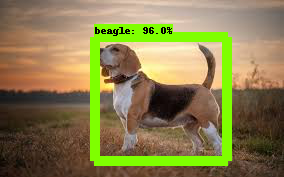

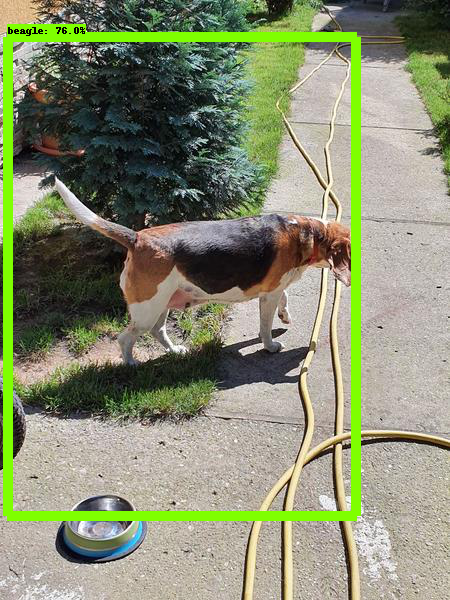

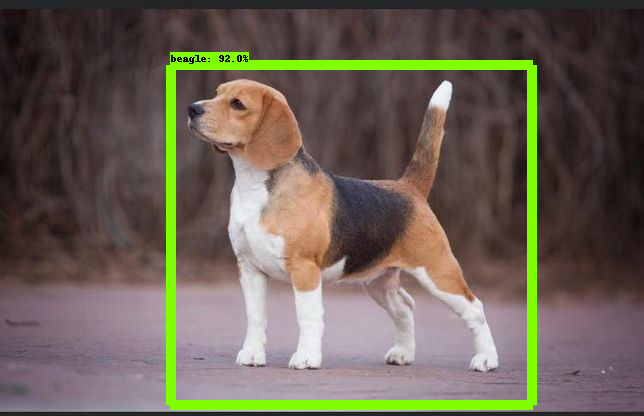

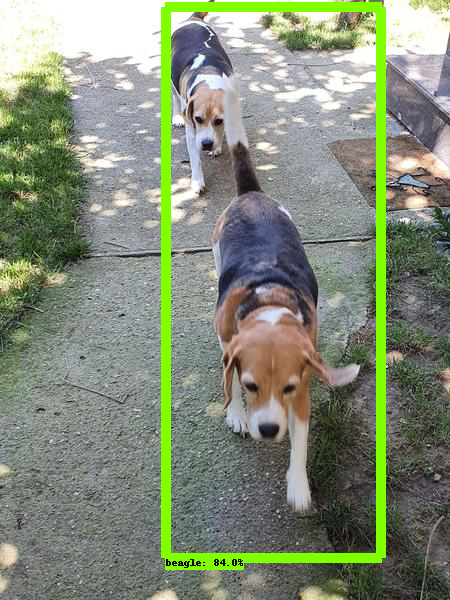

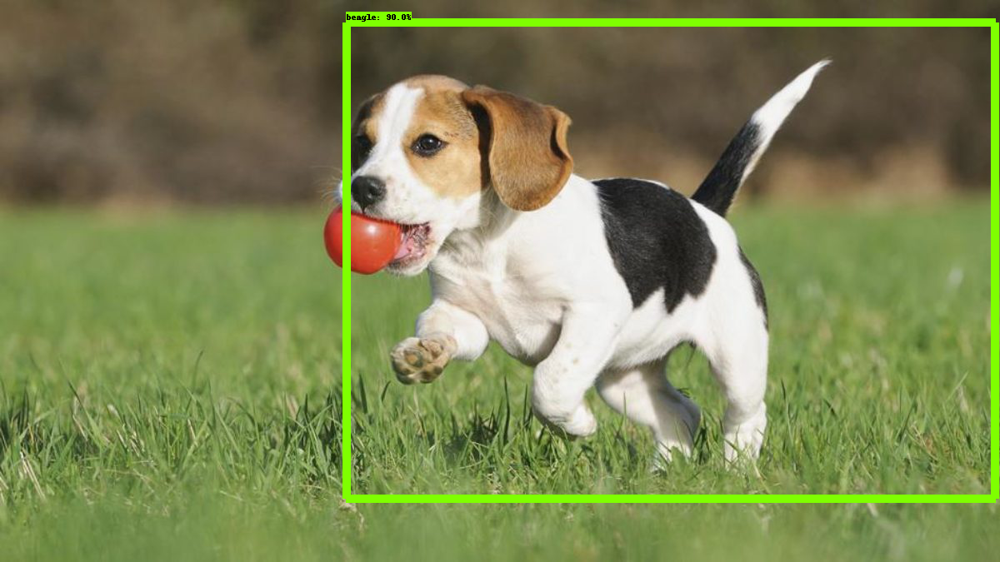

...

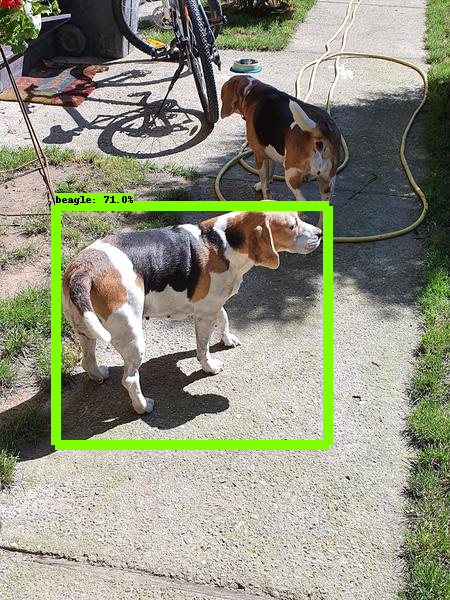

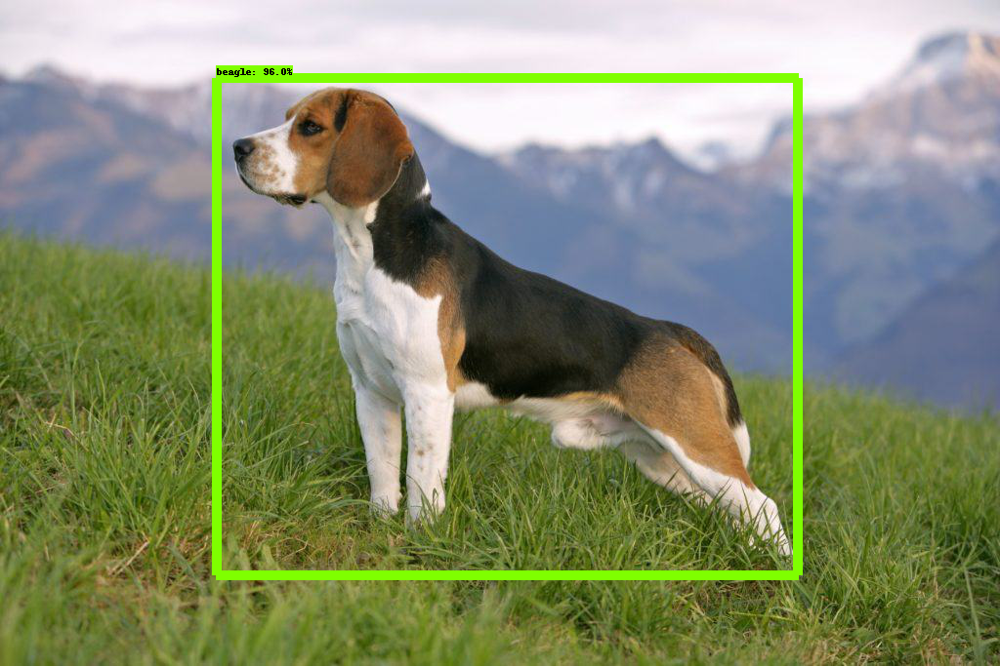

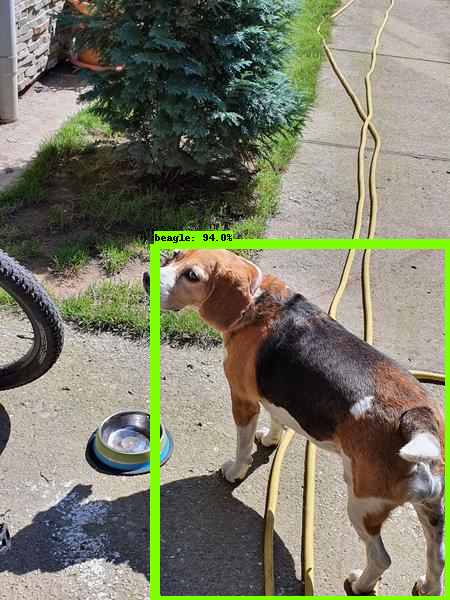

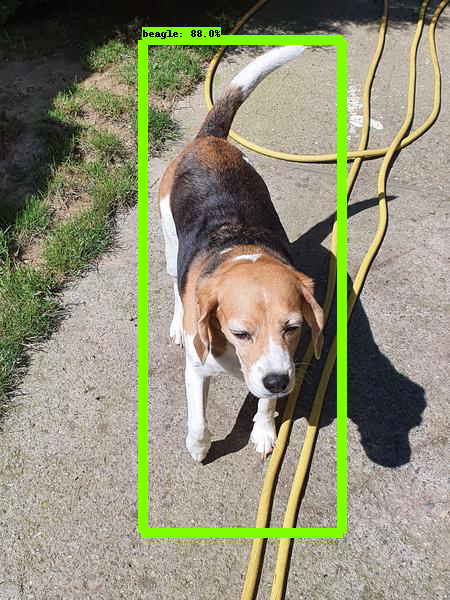

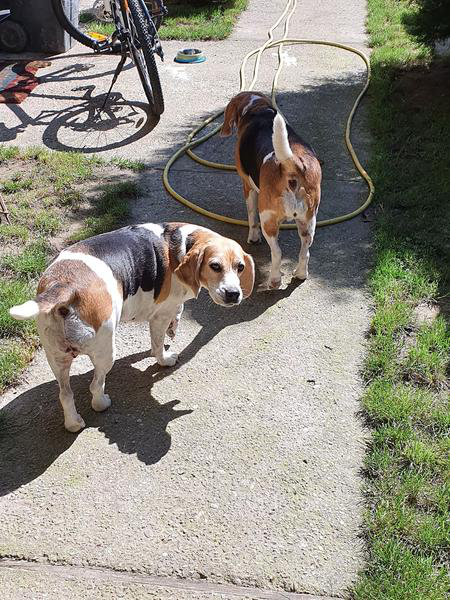

In [ ]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image_path)  
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # print(output_dict['detection_boxes'])
  # Visualization of the results of a detection.
  # print(output_dict['detection_scores'])
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      max_boxes_to_draw=10,
      min_score_thresh=0.7,
      use_normalized_coordinates=True,           
      line_thickness=10)

  display(Image.fromarray(image_np))

for image_path in glob.glob('/content/testing/*.jpg'):
  show_inference(model, image_path)